In [1]:
import pandas as pd
import numpy as numpy
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
knn_data = pd.read_csv('KNN_Project_Data.csv')
knn_data.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


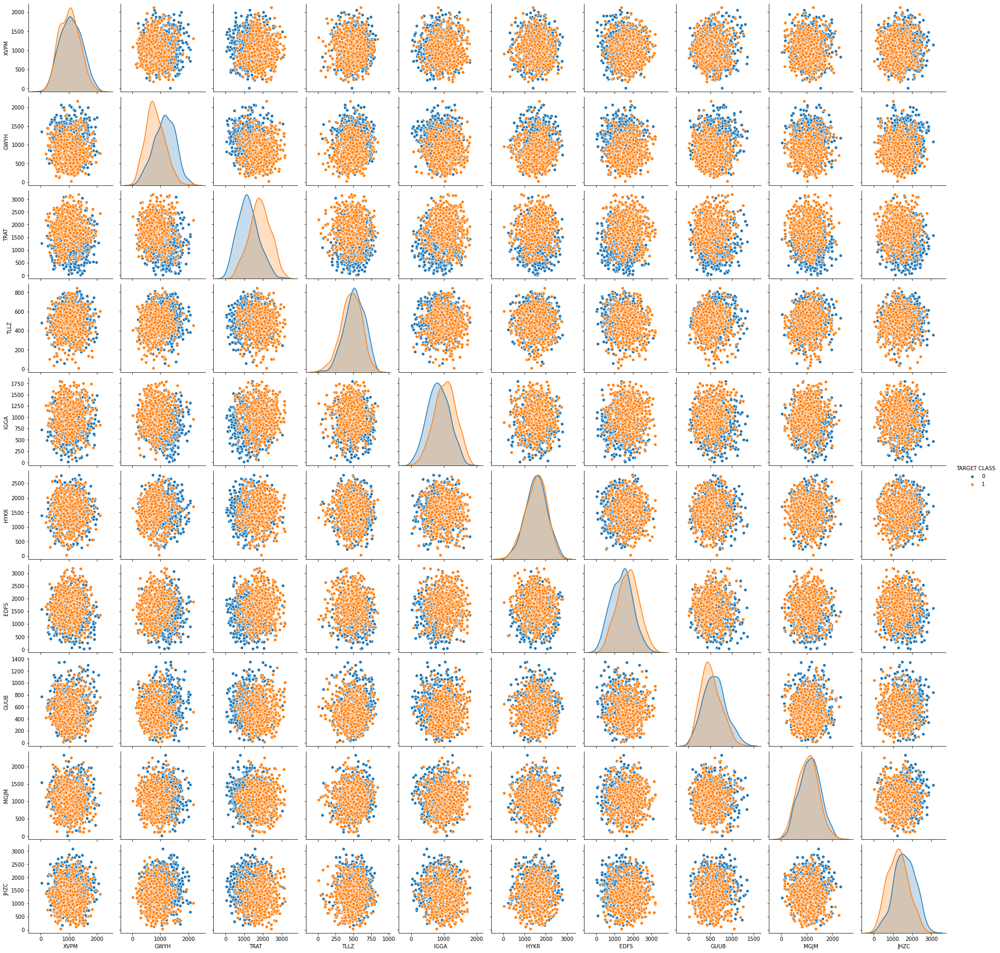

In [3]:
sns.pairplot(knn_data, hue='TARGET CLASS')

In [4]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = knn_data.iloc[:,0:len(knn_data.columns)-1]
y = knn_data['TARGET CLASS']
scaler.fit(X)
X = pd.DataFrame(scaler.transform(X))
X.columns = knn_data.iloc[:,0:len(knn_data.columns)-1].columns

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
neigh = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
               metric_params=None, n_jobs=1, n_neighbors=1, p=2,
               weights='uniform')
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_jobs=1, n_neighbors=1)

In [6]:
from sklearn.metrics import classification_report
y_pred = neigh.predict(X_test)
print(classification_report(y_test, y_pred))

precision    recall  f1-score   support

           0       0.73      0.72      0.72       152
           1       0.71      0.72      0.72       148

    accuracy                           0.72       300
   macro avg       0.72      0.72      0.72       300
weighted avg       0.72      0.72      0.72       300



In [7]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[109,  43],
       [ 41, 107]])

,K,Error_rate
0,1,0.280000
1,2,0.290000
2,3,0.216667
3,4,0.220000
4,5,0.206667
5,6,0.210000
6,7,0.183333
7,8,0.190000
8,9,0.190000
9,10,0.176667


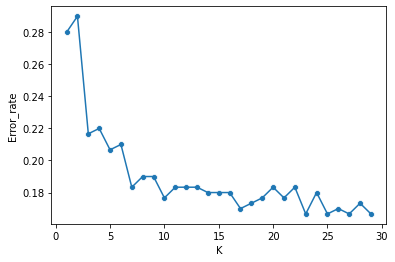

In [26]:
from sklearn.metrics import zero_one_loss
accuracy = []
for k in range(1,30):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
    neigh = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                metric_params=None, n_jobs=1, n_neighbors=k, p=2,
                weights='uniform')
    neigh.fit(X_train, y_train)
    y_pred = neigh.predict(X_test)
    accuracy.append((k, zero_one_loss(y_test, y_pred)))
k_test = pd.DataFrame(accuracy, columns='K Error_rate'.split())
sns.scatterplot(data=k_test, x='K', y='Error_rate')
sns.lineplot(data=k_test, x='K', y='Error_rate')
k_test

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)
neigh = KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
               metric_params=None, n_jobs=1, n_neighbors=22, p=2,
               weights='uniform')
neigh.fit(X_train, y_train)
y_pred = neigh.predict(X_test)
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

precision    recall  f1-score   support

           0       0.82      0.82      0.82       152
           1       0.81      0.82      0.81       148

    accuracy                           0.82       300
   macro avg       0.82      0.82      0.82       300
weighted avg       0.82      0.82      0.82       300

[[124  28]
 [ 27 121]]
